In [ ]:
# rm -rf sample_data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# [How to train Detectron2 with Custom COCO Datasets](https://www.dlology.com/blog/how-to-train-detectron2-with-custom-coco-datasets/) | DLology

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

This notebook will help you get started with this framwork by training a instance segmentation model with your custom COCO datasets.

# Install detectron2

In [ ]:
!pip install pyyaml==5.1

# IMPORTS DIRECTLY FROM OFFICIAL GITHUB REPO

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 12.4 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=8b424ce1ca06568fa0e1ff349b33285698f58aabdb5f2c0e5503e8ba6796dea5
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 227 kB/s 
     |████████████████████████████████| 50 kB 4.9 MB/s 
     |████████████████████████████████| 130 kB 24.8 MB/s 
     |████████████████████████████████| 147 kB 50.0 MB/s 
     |████████████████████████████████| 74 kB 3.5 MB/s 
     |████████████████████████████████| 843 kB 45.6 MB/s 
     |██████████████████████████████

In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup
# Setup detectron2 logger
import detectron2
import wandb
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom COCO dataset

In [ ]:
# download, decompress the data
# !curl -L "https://public.roboflow.com/ds/Dz6rrWjwxX?key=vIpLJeeYJn" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

!curl -L "https://app.roboflow.com/ds/QTYQxhu7es?key=*ENTER KEY*" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

Streaming output truncated to the last 5000 lines.
 extracting: train/003861_jpg.rf.524df14fac11fa36bf0c30c12a84299c.jpg  
 extracting: train/003861_jpg.rf.beeb7aafc9f90449b7f0425ef53d9671.jpg  
 extracting: train/003862_jpg.rf.bcc64e94497cd9212dbbbd2c54780394.jpg  
 extracting: train/003862_jpg.rf.eded7e4b9bd47e9b116cdcab12269f9a.jpg  
 extracting: train/003862_jpg.rf.fa49e9e6963eab76caf2c6a2eae30a1d.jpg  
 extracting: train/003863_jpg.rf.2d2ac81476e0e0502382c8d353973e30.jpg  
 extracting: train/003863_jpg.rf.3ff5d36c611edca7dbd90dbc239ba728.jpg  
 extracting: train/003863_jpg.rf.f17c083f1b3729b60e9b12c183a3560f.jpg  
 extracting: train/003864_jpg.rf.4f77f53b3502d9c16a6725c9affb0c3a.jpg  
 extracting: train/003864_jpg.rf.bbf05da7d69b9c0d1aeca6b0d2c0ee3f.jpg  
 extracting: train/003864_jpg.rf.bc21ac284ea8accdbc8c2e851c35997f.jpg  
 extracting: train/003865_jpg.rf.18cf1db6abfeb4cce1450c00f862640e.jpg  
 extracting: train/003865_jpg.rf.8397ebfb42ecfdf3909357fc4df3354b.jpg  
 extracting: 

Register the fruits_nuts dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).


In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("helmets", {}, "./train/_annotations.coco.json", "./train")
register_coco_instances("helmets_valid", {}, "./valid/_annotations.coco.json", "./valid")

In [ ]:
helmets_metadata = MetadataCatalog.get("helmets")
dataset_dicts = DatasetCatalog.get("helmets")

WARNING [04/20 14:38:46 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/20 14:38:46 d2.data.datasets.coco]: Loaded 15807 images in COCO format from ./train/_annotations.coco.json


To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



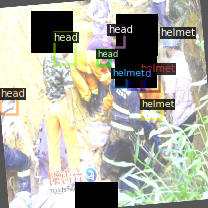

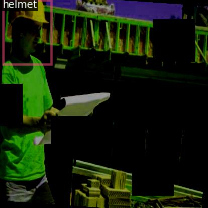

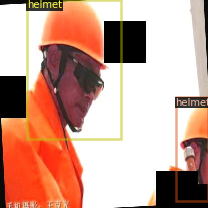

In [ ]:
import random

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=helmets_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

Now, let's fine-tune a coco-pretrained R50-FPN Faster R-CNN model on the fruits_nuts dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU.


In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
wandb.init(project='gpt4')
import os

# config = wandb.config
cfg = get_cfg()
# cfg.MODEL.DEVICE = "cpu"
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("helmets",)
cfg.DATASETS.TEST = ("helmets_valid",) 
cfg.TEST.EVAL_PERIOD = 50
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.002
cfg.SOLVER.MAX_ITER = 500    # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[04/20 14:40:58 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

[04/20 14:41:01 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[04/20 14:41:19 d2.utils.events]:  eta: 0:07:17  iter: 19  total_loss: 1.85  loss_cls: 1.194  loss_box_reg: 0.4474  loss_rpn_cls: 0.1074  loss_rpn_loc: 0.03113  time: 0.8993  data_time: 0.0173  lr: 7.7924e-05  max_mem: 2308M
[04/20 14:41:37 d2.utils.events]:  eta: 0:06:51  iter: 39  total_loss: 1.49  loss_cls: 0.7642  loss_box_reg: 0.5875  loss_rpn_cls: 0.1091  loss_rpn_loc: 0.03606  time: 0.8889  data_time: 0.0080  lr: 0.00015784  max_mem: 2308M
WARNING [04/20 14:41:46 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/20 14:41:46 d2.data.datasets.coco]: Loaded 707 images in COCO format from ./valid/_annotations.coco.json
[04/20 14:41:46 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  Workers   | 0            |    head    | 686  

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

Now, we perform inference with the trained model on the helmets/person/people dataset. First, let's create a predictor using the model we just trained:



In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
# cfg.DATASETS.TEST = ("helmets", )
predictor = DefaultPredictor(cfg)
# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
# predictor = DefaultPredictor(cfg)

In [ ]:
register_coco_instances("helmetsTest", {}, "./test/_annotations.coco.json", "./test")
helmets_test_metadata = MetadataCatalog.get("helmetsTest")
dataset_dicts_test = DatasetCatalog.get("helmetsTest")

WARNING [04/20 14:53:00 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/20 14:53:00 d2.data.datasets.coco]: Loaded 1059 images in COCO format from ./test/_annotations.coco.json


In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("helmetsTest", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "helmetsTest")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

WARNING [04/20 14:53:04 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/20 14:53:04 d2.data.datasets.coco]: Loaded 1059 images in COCO format from ./test/_annotations.coco.json
[04/20 14:53:04 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  Workers   | 0            |    head    | 1117         |   helmet   | 2900         |
|            |              |            |              |            |              |
|   total    | 4017         |            |              |            |              |
[04/20 14:53:04 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[04/20 14:53:04 d2.data.common]: Serializing 1059 elements to 

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[04/20 14:53:08 d2.evaluation.evaluator]: Inference done 11/1059. Dataloading: 0.0014 s/iter. Inference: 0.2763 s/iter. Eval: 0.0003 s/iter. Total: 0.2780 s/iter. ETA=0:04:51
[04/20 14:53:13 d2.evaluation.evaluator]: Inference done 29/1059. Dataloading: 0.0020 s/iter. Inference: 0.2756 s/iter. Eval: 0.0003 s/iter. Total: 0.2780 s/iter. ETA=0:04:46
[04/20 14:53:18 d2.evaluation.evaluator]: Inference done 48/1059. Dataloading: 0.0022 s/iter. Inference: 0.2753 s/iter. Eval: 0.0003 s/iter. Total: 0.2779 s/iter. ETA=0:04:40
[04/20 14:53:23 d2.evaluation.evaluator]: Inference done 66/1059. Dataloading: 0.0022 s/iter. Inference: 0.2752 s/iter. Eval: 0.0003 s/iter. Total: 0.2779 s/iter. ETA=0:04:35
[04/20 14:53:28 d2.evaluation.evaluator]: Inference done 85/1059. Dataloading: 0.0021 s/iter. Inference: 0.2750 s/iter. Eval: 0.0003 s/iter. Total: 0.2775 s/iter. ETA=0:04:30
[04/20 14:53:34 d2.evaluation.evaluator]: Inference done 104/1059. Dataloading: 0.0021 s/iter. Inference: 0.2749 s/iter. Eval

Then, we randomly select several samples to visualize the prediction results.

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


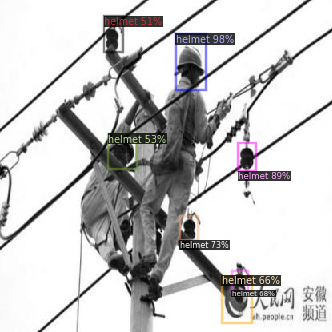

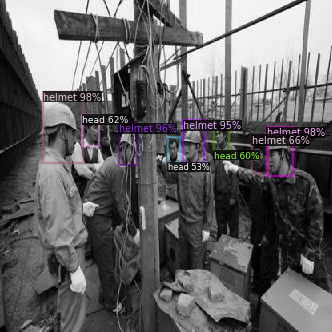

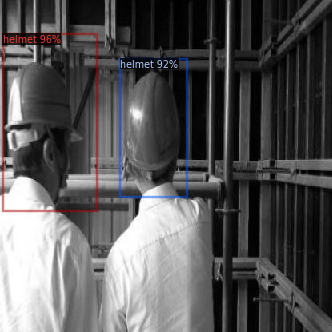

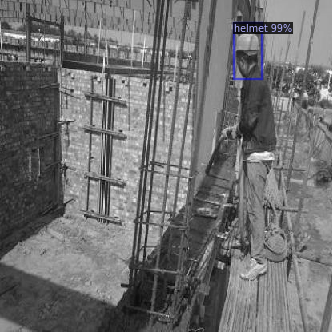

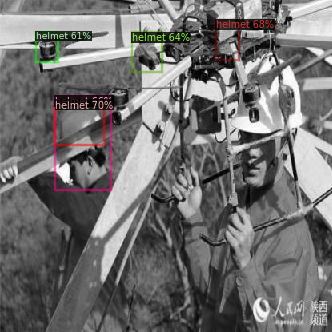

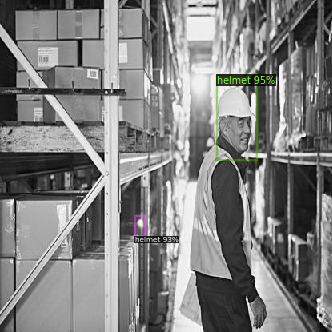

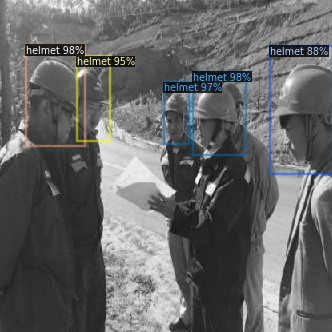

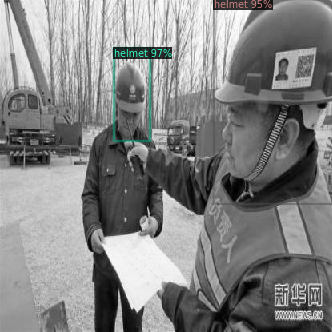

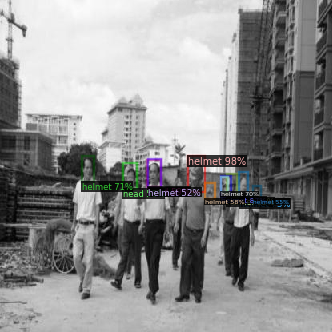

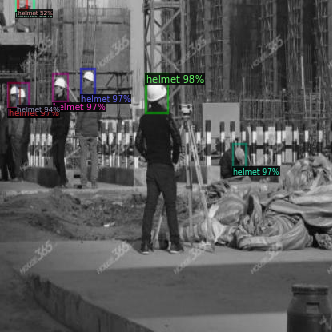

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts_test, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=helmets_test_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    # v = v.draw_instance_predictions(outputs["instances"][outputs['instances'].pred_classes == 2].to("cpu"))
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
helmets_metadata
helmets_test_metadata